In [18]:
import xarray as xr
import matplotlib.pyplot as plt
# from cmocean import cm 
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle

In [2]:
ds = xr.open_dataset(r'../data/amazon2.nc')

### Now we interpolate U,V to have more z points in the lower layers

#### Create more z points

[4.940250e-01 1.541375e+00 2.645669e+00 3.819495e+00 5.078224e+00
 6.440614e+00 7.929560e+00 9.572997e+00 1.140500e+01 1.346714e+01
 1.581007e+01 1.849556e+01 2.159882e+01 2.521141e+01 2.944473e+01
 3.443415e+01 4.034405e+01 4.737369e+01 5.576429e+01 6.580727e+01
 7.785385e+01 9.232607e+01 1.097293e+02 1.306660e+02 1.558507e+02
 1.861256e+02 2.224752e+02 2.660403e+02 3.181274e+02 3.802130e+02
 4.539377e+02 5.410889e+02 6.435668e+02 7.633331e+02 9.023393e+02
 1.062440e+03 1.245291e+03 1.452251e+03 1.684284e+03 1.941893e+03
 2.225078e+03 2.533336e+03 2.865703e+03 3.220820e+03 3.597032e+03
 3.992484e+03 4.405224e+03 4.833291e+03 5.274784e+03 5.727917e+03]


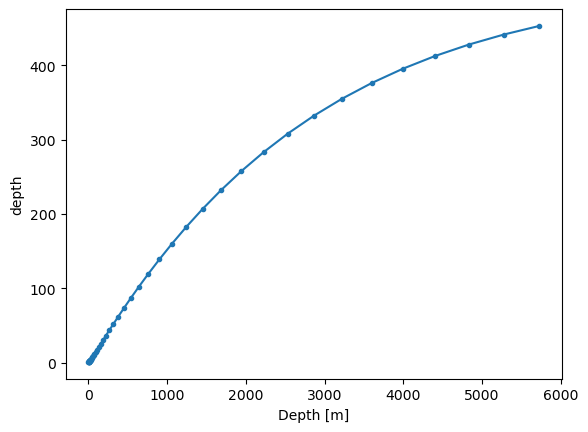

In [3]:
ds.depth.diff(dim='depth').plot(marker='.')
print(ds.depth.data)

In [4]:
z_orig = ds.depth  # (depth,)
z_threshold = 1000  # metros

# Dividir en superficial y profundo
z_shallow = z_orig.where(z_orig < z_threshold, drop=True)
z_deep = z_orig.where(z_orig >= z_threshold, drop=True)

# Interpolar verticalmente duplicando puntos entre capas profundas
z_deep_mid = (z_deep.shift(depth=-1)+z_deep)/2 
z_deep_mid=z_deep_mid.dropna(dim='depth')

z_new = xr.concat([z_shallow,z_deep, z_deep_mid], dim='depth').sortby('depth')
z_new.name = "depth_refined"

print(z_deep_mid)
print(z_deep)
print(z_new)

<xarray.DataArray 'depth' (depth: 14)> Size: 56B
array([1153.8655, 1348.771 , 1568.2676, 1813.0885, 2083.4854, 2379.207 ,
       2699.5195, 3043.2615, 3408.926 , 3794.7578, 4198.854 , 4619.258 ,
       5054.0376, 5501.3506], dtype=float32)
Coordinates:
  * depth    (depth) float32 56B 1.062e+03 1.245e+03 ... 4.833e+03 5.275e+03
<xarray.DataArray 'depth' (depth: 15)> Size: 60B
array([1062.44 , 1245.291, 1452.251, 1684.284, 1941.893, 2225.078,
       2533.336, 2865.703, 3220.82 , 3597.032, 3992.484, 4405.224,
       4833.291, 5274.784, 5727.917], dtype=float32)
Coordinates:
  * depth    (depth) float32 60B 1.062e+03 1.245e+03 ... 5.275e+03 5.728e+03
Attributes:
    standard_name:  depth
    long_name:      Depth
    units:          m
    unit_long:      Meters
    axis:           Z
    positive:       down
<xarray.DataArray 'depth_refined' (depth: 64)> Size: 256B
array([4.9402499e-01, 1.5413750e+00, 2.6456690e+00, 3.8194950e+00,
       5.0782242e+00, 6.4406142e+00, 7.9295602e+00, 9.57299

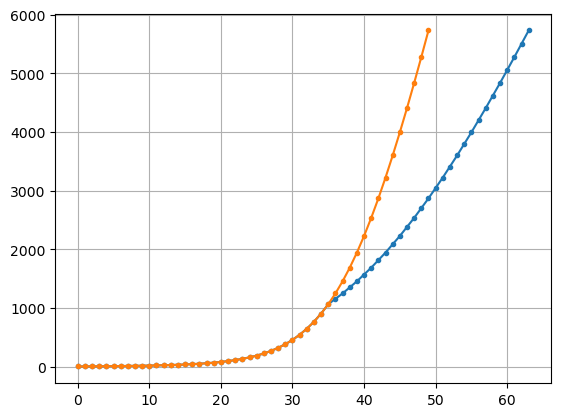

In [5]:
zz = np.concatenate([z_shallow.data, z_deep,z_deep_mid.data], axis=0)
zz = np.sort(zz)
plt.plot(zz,marker='.')
plt.plot(z_orig.data,marker='.')
plt.grid()

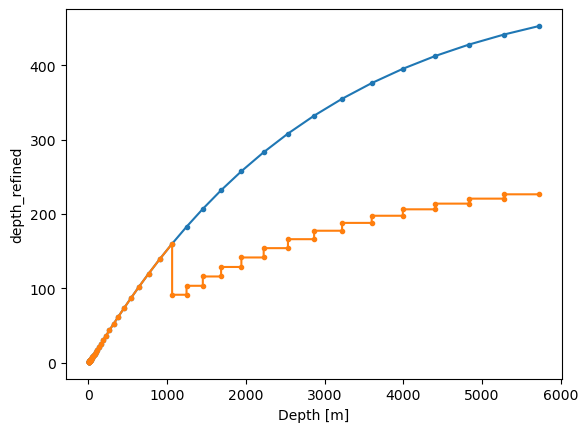

In [6]:
ds.depth.diff(dim='depth').plot(marker='.',x='depth')
z_new.diff(dim='depth').plot(marker='.',x='depth')

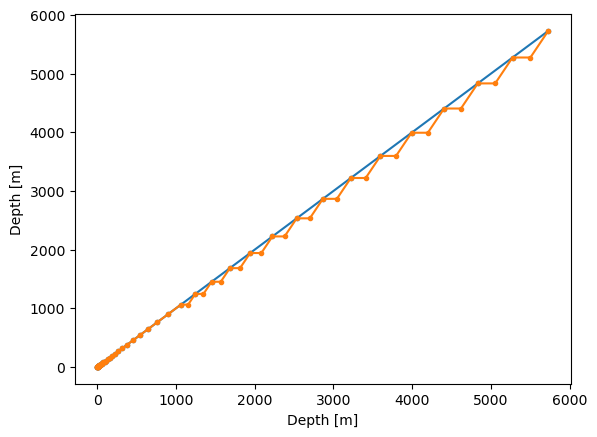

In [7]:
ds.depth.plot(y='depth',marker='.')
z_new.plot(y='depth',marker='.')

In [8]:
zz = xr.DataArray(
    z_new.values,
    dims=["depth"],
    coords={"depth": z_new.values},
    name="depth"
)
zz

<xarray.DataArray 'depth' (depth: 64)> Size: 256B
array([4.9402499e-01, 1.5413750e+00, 2.6456690e+00, 3.8194950e+00,
       5.0782242e+00, 6.4406142e+00, 7.9295602e+00, 9.5729971e+00,
       1.1405000e+01, 1.3467140e+01, 1.5810070e+01, 1.8495560e+01,
       2.1598820e+01, 2.5211411e+01, 2.9444731e+01, 3.4434151e+01,
       4.0344051e+01, 4.7373692e+01, 5.5764290e+01, 6.5807266e+01,
       7.7853851e+01, 9.2326073e+01, 1.0972930e+02, 1.3066600e+02,
       1.5585069e+02, 1.8612560e+02, 2.2247520e+02, 2.6604031e+02,
       3.1812741e+02, 3.8021301e+02, 4.5393771e+02, 5.4108893e+02,
       6.4356677e+02, 7.6333313e+02, 9.0233929e+02, 1.0624399e+03,
       1.1538655e+03, 1.2452910e+03, 1.3487710e+03, 1.4522510e+03,
       1.5682676e+03, 1.6842841e+03, 1.8130885e+03, 1.9418929e+03,
       2.0834854e+03, 2.2250779e+03, 2.3792070e+03, 2.5333359e+03,
       2.6995195e+03, 2.8657029e+03, 3.0432615e+03, 3.2208201e+03,
       3.4089260e+03, 3.5970320e+03, 3.7947578e+03, 3.9924839e+03,
       4.1988540e+03, 4.4052241e+03, 4.6192578e+03, 4.8332910e+03,
       5.0540376e+03, 5.2747842e+03, 5.5013506e+03, 5.7279170e+03],
      dtype=float32)
Coordinates:
  * depth    (depth) float32 256B 0.494 1.541 2.646 ... 5.501e+03 5.728e+03

#### Interpolate

In [9]:
zz.name = "depth"  # debe coincidir con el nombre del eje de profundidad en ds

# Interpolar uo y vo a la nueva malla de profundidad
uo_interp = ds.uo.interp(depth=zz)
vo_interp = ds.vo.interp(depth=zz)

In [10]:
ds_interp = xr.Dataset({
    "uo": uo_interp,
    "vo": vo_interp
})
ds_interp

<xarray.Dataset> Size: 180MB
Dimensions:    (time: 10, latitude: 177, longitude: 199, depth: 64)
Coordinates:
  * time       (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * latitude   (latitude) float32 708B -3.667 -3.583 -3.5 ... 10.83 10.92 11.0
  * longitude  (longitude) float32 796B -57.75 -57.67 -57.58 ... -41.33 -41.25
  * depth      (depth) float32 256B 0.494 1.541 2.646 ... 5.501e+03 5.728e+03
Data variables:
    uo         (time, depth, latitude, longitude) float32 90MB nan nan ... nan
    vo         (time, depth, latitude, longitude) float32 90MB nan nan ... nan

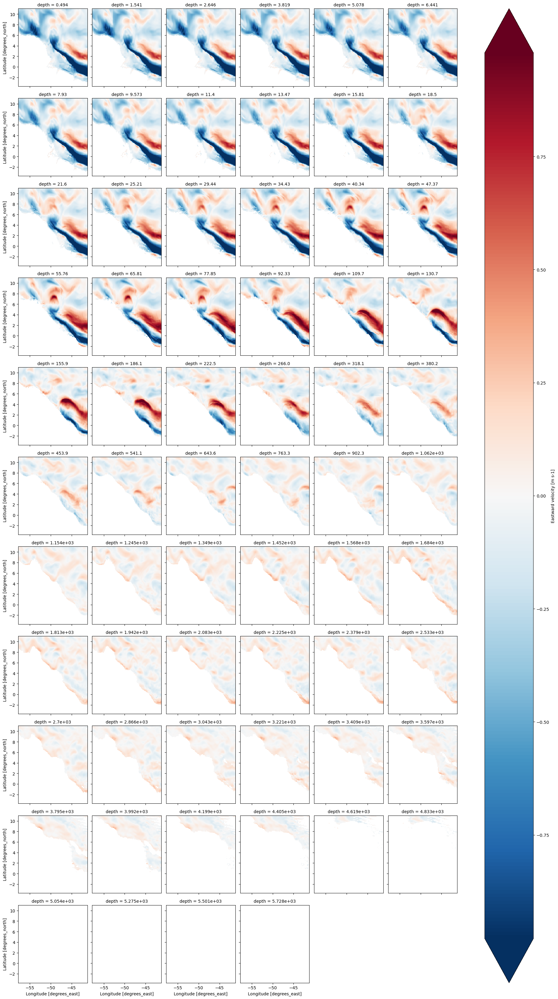

In [11]:
uo_interp.isel(time=0).plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

## Computing Vertical Velocity \( w \) from Horizontal Divergence

Vertical velocity \( w \) in the ocean can be derived from the continuity equation for incompressible flow:

\[
\frac{\partial w}{\partial z} = -\nabla_H \cdot \vec{u}_H
\]

where:
- $\vec{u}_H = (u, v) $ is the horizontal velocity vector,
- $\nabla_H \cdot \vec{u}_H $ is the horizontal divergence of the flow.

### Bottom-Up Integration

By integrating this equation from the bottom $( z = H )$ upward to a given depth $ z $, we obtain:

$\[
w(z) = \int_H^z -\nabla_H \cdot \vec{u}_H(z') \, dz'
\]$

In discrete form, this integral becomes an upward cumulative sum:

$\[
w_k = \sum_{j=k}^{N} \left( -\nabla_H \cdot \vec{u}_H(j) \cdot \Delta z_j \right)
\]$

where:
- $\( \Delta z_j \)$ is the thickness of layer $\( j \)$,
- $\( N \)$ is the index of the deepest layer.

This **bottom-up** approach is preferred because it **minimizes the accumulation of numerical errors near the bottom**, unlike top-down integration which tends to amplify errors toward deeper layers.

### Implementation in Xarray

1. **Compute the integrand** (divergence × thickness):
```python
integrand = (-div_h.isel(depth=slice(0, -1))) * dz.broadcast_like(div_h.isel(depth=slice(0, -1)))


In [12]:
A = 6371.0e3  # radio terrestre en metros

# Selecciona los campos de velocidad
u = ds_interp.uo.isel(time=0)
v = ds_interp.vo.isel(time=0)

# --------------------------
# 1. CÁLCULO DE DX, DY, DZ
# --------------------------

dy = np.deg2rad(ds_interp.latitude.shift(latitude=-1) - ds_interp.latitude) * A
dx = (
    np.deg2rad(ds_interp.longitude.shift(longitude=-1) - ds_interp.longitude)
    * A * np.cos(np.deg2rad(ds.latitude))
)

# z_mid y dz entre niveles
z_mid = (ds_interp.depth.shift(depth=-1) + ds_interp.depth) / 2
z_mid = z_mid.isel(depth=slice(0, -1))  # 49 niveles, sin NaN
dz = ds_interp.depth.diff('depth')             # también 49 niveles

# --------------------------
# 2. INTERPOLACIÓN A CENTRO DE CELDA
# --------------------------

# dudx al centro horizontal
dudx = (u.shift(longitude=-1) - u) / dx
dudx = (dudx.shift(latitude=-1) + dudx) / 2.0

# dvdy al centro horizontal
dvdy = (v.shift(latitude=-1) - v) / dy
dvdy = (dvdy.shift(longitude=-1) + dvdy) / 2.0

# lat/lon en el centro
lon_c = (ds_interp.longitude.shift(longitude=-1) + ds_interp.longitude) / 2
lat_c = (ds_interp.latitude.shift(latitude=-1) + ds_interp.latitude) / 2

# Ajustar coordenadas y recortar bordes (porque hicimos shift)
dudx = dudx.assign_coords(longitude=lon_c, latitude=lat_c).isel(longitude=slice(None, -1), latitude=slice(None, -1))
dvdy = dvdy.assign_coords(longitude=lon_c, latitude=lat_c).isel(longitude=slice(None, -1), latitude=slice(None, -1))

# --------------------------
# 3. DIVERGENCIA HORIZONTAL
# --------------------------

div_h = dudx + dvdy
div_h = div_h.transpose("depth", "latitude", "longitude")

# --------------------------
# 4. INTEGRACIÓN BOTTOM-UP
# --------------------------

# Broadcast dz al shape de div_h
dz_3d = dz.broadcast_like(div_h.isel(depth=slice(0, -1)))

# Paso 1: calculamos el integrando
integrand = (-div_h.isel(depth=slice(0, -1))) * dz_3d  # [m/s]

# Paso 2: integración acumulativa desde el fondo
integrand_rev = integrand.isel(depth=slice(None, None, -1))
w_bottom_up = integrand_rev.cumsum(dim="depth", skipna=True)
w_bottom_up = w_bottom_up.isel(depth=slice(None, None, -1))  # reordenar

# Paso 3: asignar coordenadas de profundidad intermedia
w_bottom_up = w_bottom_up.assign_coords(depth=z_mid)
w_bottom_up.name = "w_bottom_up"

# Paso 4: (opcional) interpolar al centro del grid T
w_Tgrid = ((w_bottom_up + w_bottom_up.shift(depth=-1)) / 2).fillna(0)
w_Tgrid.name = "w_Tgrid"

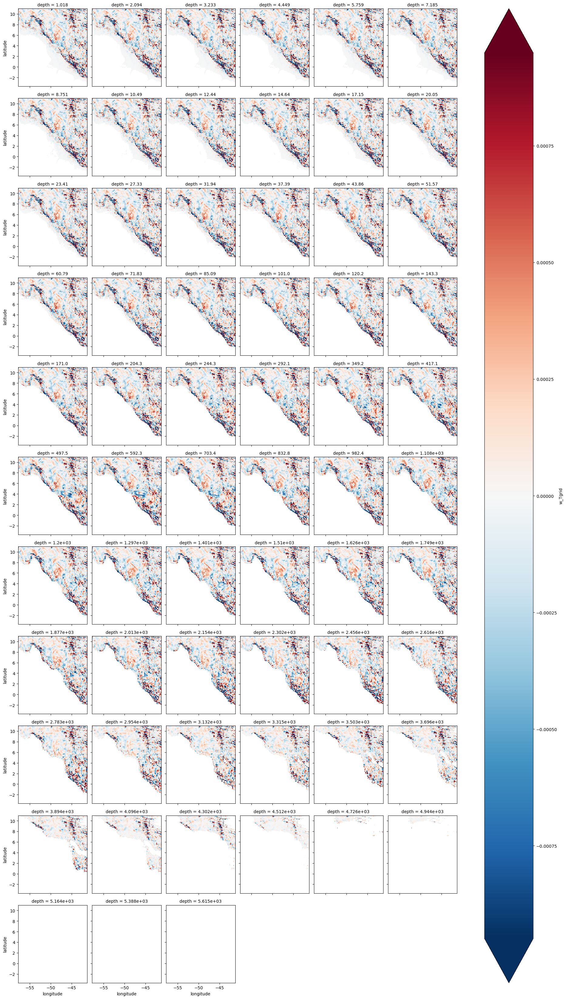

In [13]:
w_Tgrid = w_Tgrid.where(w_Tgrid!=0,np.nan)
w_Tgrid.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

In [14]:
u=ds_interp.uo.isel(time=0,longitude=slice(98,100),latitude=slice(98,100))
v=ds_interp.vo.isel(time=0,longitude=slice(98,100),latitude=slice(98,100))
w=w_Tgrid.isel(longitude=slice(98,100),latitude=slice(98,100))

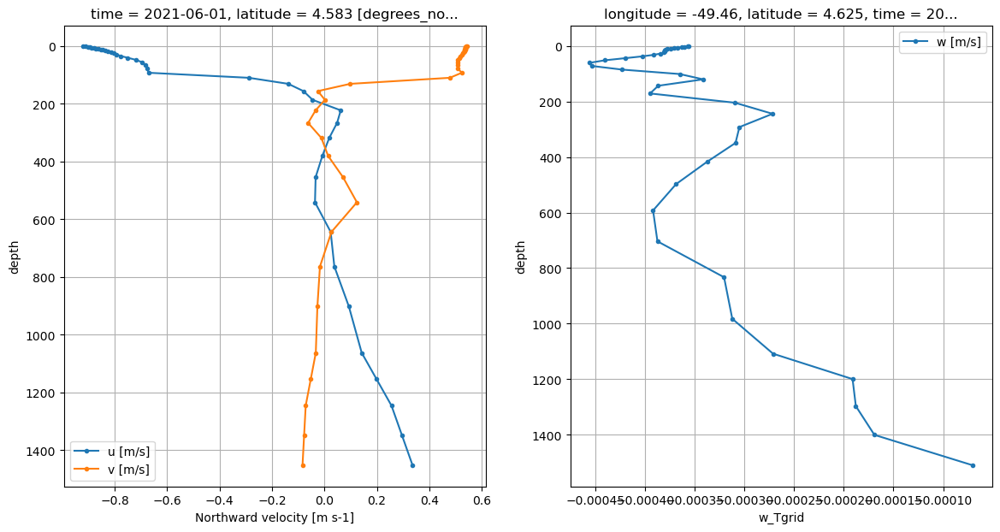

In [15]:
fig,ax = plt.subplots(1,2,figsize=(14,7))

u.isel(longitude=1,latitude=1).plot(y='depth',marker='.',label='u [m/s]',ax=ax[0])
v.isel(longitude=1,latitude=1).plot(y='depth',marker='.', label='v [m/s]',ax=ax[0])
ax[0].invert_yaxis()
ax[0].grid('minor')
ax[0].legend()
# ax[0].set_title("U and V profile")

w.isel(longitude=1,latitude=1).plot(y='depth',marker='.', label='w [m/s]',ax=ax[1])
# ax[1].set_ylim(0,1500)
ax[1].invert_yaxis()
ax[1].grid('minor')
ax[1].legend()
# ax[1].set_title("W profile")

plt.legend()

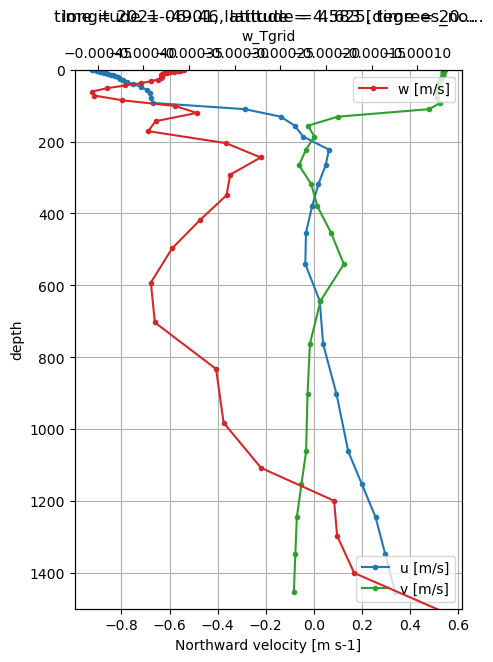

In [16]:
fig, ax = plt.subplots(figsize=(5, 7))

# Eje inferior: u y v
u.isel(longitude=1, latitude=1).plot(
    y='depth', marker='.', label='u [m/s]', ax=ax, color='tab:blue'
)
v.isel(longitude=1, latitude=1).plot(
    y='depth', marker='.', label='v [m/s]', ax=ax, color='tab:green'
)
ax.set_ylim(0,1500)
ax.invert_yaxis()
ax.grid('minor')
ax.legend(loc='lower right')
# ax.set_title("Profiles of u, v and w")

# Eje superior: w
ax2 = ax.twiny()
w.isel(longitude=1, latitude=1).plot(
    y='depth', marker='.', label='w [m/s]', ax=ax2, color='tab:red'
)

# Ejes bien alineados
# ax2.set_xlabel("w [m/s]")
ax2.legend(loc='upper right')

### Calculate the W from an Area

Chosen area: 10N-8N, 45W to 47W.

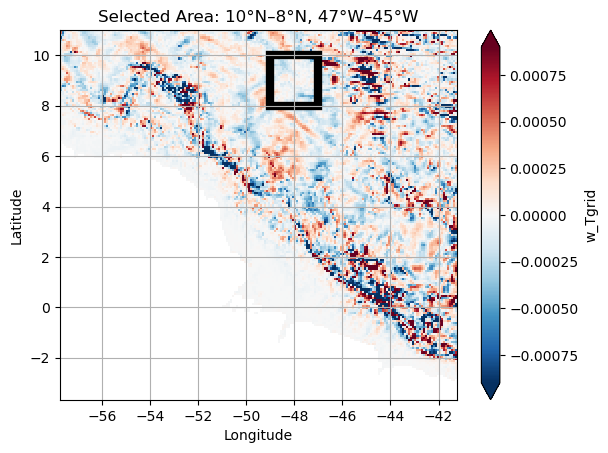

In [19]:
# Hacer el plot y capturar el eje
fig, ax = plt.subplots()
w_Tgrid.isel(depth=0).plot(x='longitude', y='latitude', robust=True, ax=ax)

# Añadir rectángulo al eje
rect = Rectangle(
    xy=(-49, 8), width=2, height=2,
    linewidth=6, edgecolor='black', facecolor='none', linestyle='-'
)
ax.add_patch(rect)

# Opcional: ajustar límites
# ax.set_xlim(-50, -43)
# ax.set_ylim(6, 12)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Selected Area: 10°N–8°N, 47°W–45°W")
ax.grid(True)

plt.show()

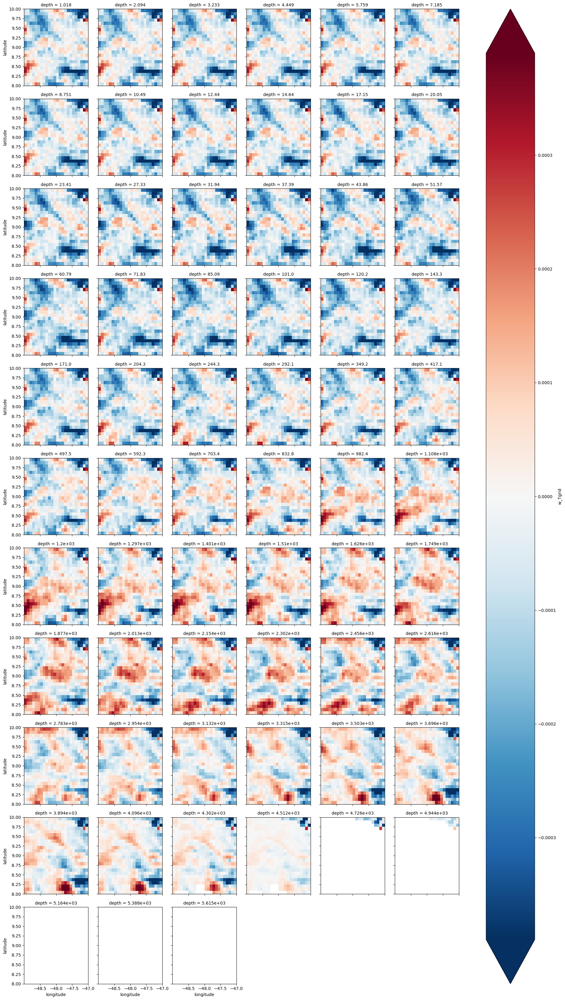

In [20]:
w_Tgrid.sel(latitude=slice(8,10),longitude=slice(-49,-47)).plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

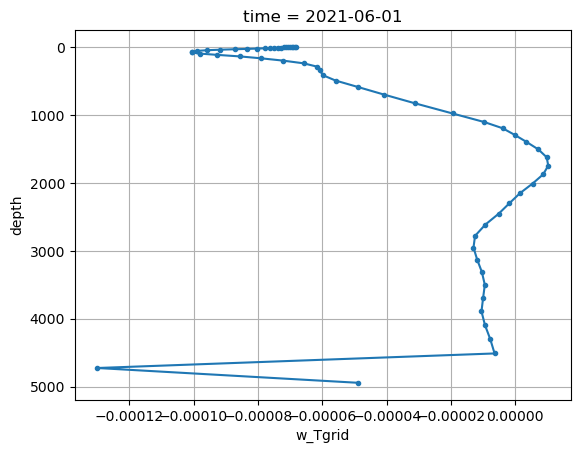

In [21]:
w_Tgrid.sel(latitude=slice(8,10),longitude=slice(-49,-47)).mean(dim=('latitude','longitude'),skipna=True).plot(y='depth',marker='.')
plt.gca().invert_yaxis()
plt.grid()

In [22]:
lat_min, lat_max = 8, 10
lon_min, lon_max = -49, -47

mask = (
    ((w_Tgrid.latitude >= lat_min) & (w_Tgrid.latitude <= lat_max)) &
    ((w_Tgrid.longitude >= lon_min) & (w_Tgrid.longitude <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
binary_mask = mask.astype(int)

# Broadcast to depth
mask_3d = xr.broadcast(w_Tgrid.isel(depth=0)*0 + 1, binary_mask)[1]
mask_3d = mask_3d.where(mask_3d!=0,np.nan)

## ----- max for U,V in the corners
mask = (
    ((ds_interp.latitude >= lat_min) & (ds_interp.latitude <= lat_max)) &
    ((ds_interp.longitude >= lon_min) & (ds_interp.longitude <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
bmask = mask.astype(int)

# Broadcast to depth
mask_3c = xr.broadcast(ds_interp.uo.isel(depth=0)*0 + 1, bmask)[1]
mask_3c = mask_3c.where(mask_3c!=0,np.nan)

In [23]:
uu = (ds_interp.uo * mask_3c).isel(time=0)
vv = (ds_interp.vo * mask_3c).isel(time=0)
ww = (w_Tgrid * mask_3d)

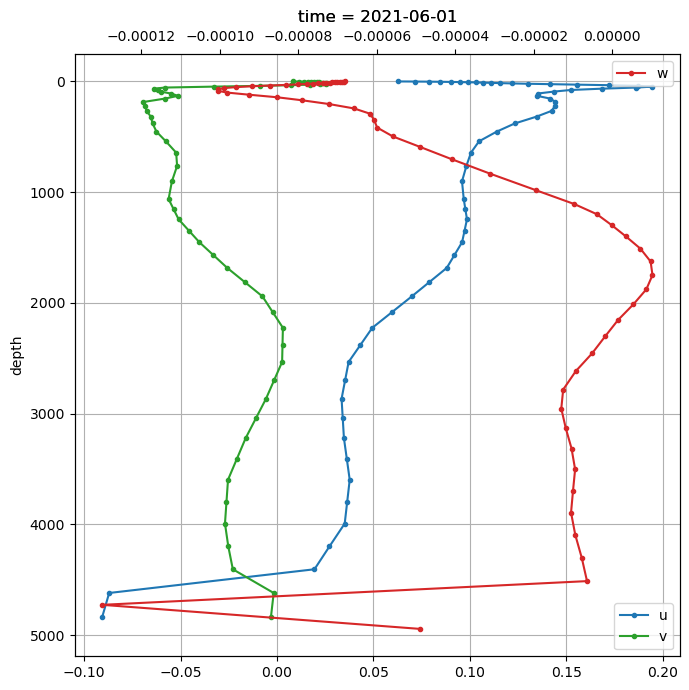

In [24]:
fig, ax = plt.subplots(figsize=(7, 7))

# Eje inferior: u y v
uu.mean(dim=('latitude', 'longitude'), skipna=True).plot(
    y='depth', marker='.', label='u', ax=ax, color='tab:blue')

vv.mean(dim=('latitude', 'longitude'), skipna=True).plot(
    y='depth', marker='.', label='v', ax=ax, color='tab:green')

# ax.set_ylim(0, 1500)
ax.invert_yaxis()
ax.grid(visible=True)
ax.legend(loc='lower right')

# Eje superior: w
ax2 = ax.twiny()
ww.mean(dim=('latitude', 'longitude'), skipna=True).plot(
    y='depth', marker='.', label='w', ax=ax2, color='tab:red')

ax2.legend(loc='upper right')

plt.tight_layout()
# plt.grid(True)
plt.show()

## Finite volume approach ? 

$$
w_{k+\frac{1}{2}} = \sum_{j=k+1}^{N} \left( - \left( \nabla_h \cdot \vec{u} \right)_j \cdot \Delta z_j \right)
$$

$$
w = \frac{w_{k+\frac{1}{2}}}{\Delta x \cdot \Delta y}
$$

### Finite Volume Estimation of Vertical Velocity

We estimate the vertical velocity \( w \) at the interface between levels using the **finite volume approach**:

$$
w_{k+\frac{1}{2}} = \sum_{j=k+1}^{N} \left( - \left( \nabla_h \cdot \vec{u} \right)_j \cdot \Delta z_j \right)
$$

Where:

- $\( w_{k+\frac{1}{2}} \)$: vertical velocity at the interface between depth levels $\( k \)$ and $\( k+1 \)$ (i.e., at the T-point)
- $\( \nabla_h \cdot \vec{u} \)$: horizontal divergence at level $\( j \)$
- $\( \Delta z_j \)$: vertical thickness of layer $\( j \)$
- $\( N \)$: number of vertical levels
- The summation is performed **from bottom to top**, i.e., accumulating horizontal divergence from deeper layers up to level $\( k \)$

To express $\( w \)$ as a velocity per unit area, we normalize by the horizontal area of the grid cell:

$$
w = \frac{w_{k+\frac{1}{2}}}{\Delta x \cdot \Delta y}
$$

Where:

- $\( \Delta x, \Delta y \)$: horizontal grid spacing in the x and y directions respectively

> **Note:** This method is conservative and accounts for the mass budget within each control volume (finite volume), making it suitable for gridded ocean model outputs like those from Copernicus mesh type A or T.


### Computation of Vertical Velocity from Continuity Equation

We start from the incompressible continuity equation:

$[
\nabla \cdot \vec{u} + \frac{\partial w}{\partial z} = 0
\quad \Rightarrow \quad
\frac{\partial w}{\partial z} = -\left( \frac{\partial u}{\partial x} + \frac{\partial v}{\partial y} \right)
]$

We integrate vertically from the bottom (at depth $ (z_N ))$ up to the interface $( z_{k+\frac{1}{2}} )$:

$[
w_{k+\frac{1}{2}} = \int_{z_{k+1}}^{z_N} -\left( \nabla_h \cdot \vec{u} \right) \, dz
]
$
We approximate this integral as a discrete sum:

$
[
w_{k+\frac{1}{2}} \approx \sum_{j=k+1}^{N} \left( -\left( \nabla_h \cdot \vec{u} \right)_j \cdot \Delta z_j \right)
]
$

---

### Volume Flux Formulation

We compute horizontal volume fluxes in each grid cell:

$
[
F_u = u \cdot \Delta y \cdot \Delta z, \quad
F_v = v \cdot \Delta x \cdot \Delta z
\quad \text{(units: m}^3/\text{s)}
]
$

Then compute the divergence of these fluxes:

$
[
\frac{\partial F_u}{\partial x} + \frac{\partial F_v}{\partial y}
\quad \text{(units: m}^2/\text{s)}
]
$

We multiply this by the layer thickness:

$
[
\left( \frac{\partial F_u}{\partial x} + \frac{\partial F_v}{\partial y} \right) \cdot \Delta z
\quad \text{(units: m}^3/\text{s)}
]
$

And integrate upward from the bottom:

$
[
W_{k+\frac{1}{2}} = \sum_{j=k+1}^{N} \left[ -\left( \frac{\partial F_u}{\partial x} + \frac{\partial F_v}{\partial y} \right)_j \cdot \Delta z_j \right]
]
$

This gives the vertical **volume flux** $( W_{k+\frac{1}{2}} )$ through the horizontal cell area, with units:

$
[
[W] = \text{m}^3/\text{s}
]
$

---

### Conversion to Vertical Velocity

To convert this to vertical **velocity** \( w \) in m/s, we divide by the horizontal cell area:

$
[
w_{k+\frac{1}{2}} = \frac{W_{k+\frac{1}{2}}}{\Delta x \cdot \Delta y}
\quad \text{(units: m/s)}
]
$

---

### Summary

- We used the continuity equation to derive vertical transport from horizontal divergence.
- Our computed variable \( W \) has units of m³/s (volume flux).
- Dividing by cell area recovers vertical velocity \( w \) in m/s.


In [25]:
R = 6371e3  # Earth radius in meters

# Load your u, v, and coordinates (1 time step)
u = ds_interp.uo.isel(time=0)  # (depth, lat, lon)
v = ds_interp.vo.isel(time=0)

lat = ds_interp.latitude
lon = ds_interp.longitude
depth = ds_interp.depth

##mid z
z_midi = (ds_interp.depth.shift(depth=-1) + ds_interp.depth) / 2
z_midi = z_midi.isel(depth=slice(0, -1)) 

# 1. Compute dx and dy in meters
dy = np.deg2rad(lat.diff('latitude')) * R
dy = dy.pad(latitude=(0,0), mode='edge')  # match dims

dx = np.deg2rad(lon.diff('longitude')) * R * np.cos(np.deg2rad(lat))
dx = dx.pad(longitude=(0,0), mode='edge')

# 2. Compute dz (layer thickness)
dz = depth.diff('depth')
# dz = dz.pad(depth=(0,1), mode='edge')  # pad bottom layer

# 3. Broadcast shapes for dx, dy, dz
dx_3d = dx.broadcast_like(u)
dy_3d = dy.broadcast_like(v)
dz_3d = dz.broadcast_like(u)

# 4. Compute fluxes
F_u = u * dy_3d * dz_3d  # zonal volume flux
F_v = v * dx_3d * dz_3d  # meridional volume flux

# 5. Compute divergence of volume fluxes
dF_u_dx = (F_u.shift(longitude=-1) - F_u) / dx_3d
dF_v_dy = (F_v.shift(latitude=-1) - F_v) / dy_3d

div_flux = dF_u_dx + dF_v_dy

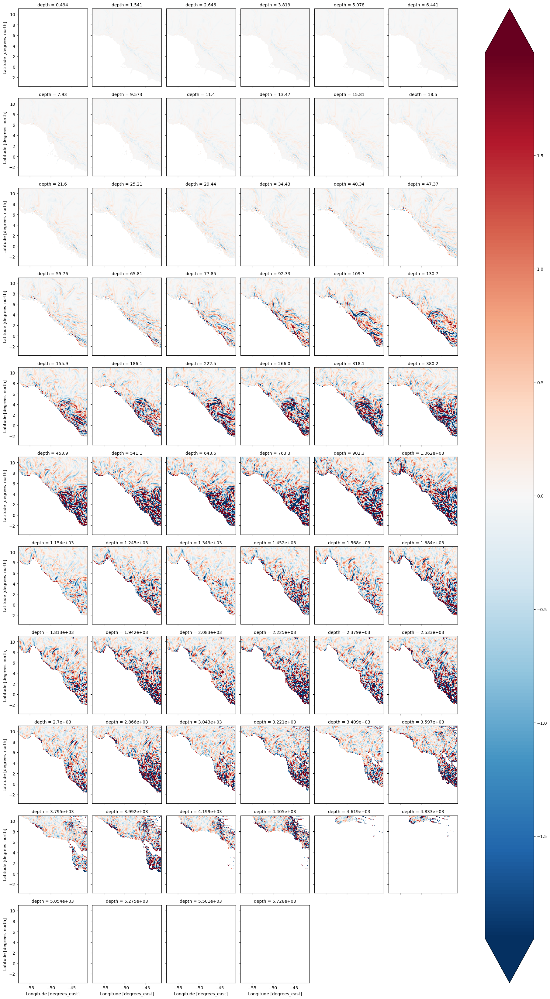

In [26]:
div_flux.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

In [27]:
# dz_3d = dz.broadcast_like(div_flux.isel(depth=slice(0, -1)))
# 6. Integrate from bottom to top
integrand = -div_flux.isel(depth=slice(0, -1))
dz_3d_mid = dz_3d.isel(depth=slice(0, -1))
integrand = integrand * dz_3d_mid

# Reverse for bottom-up integration
w_bottom_up = integrand.isel(depth=slice(None, None, -1)).cumsum(dim='depth', skipna=True)
w_bottom_up = w_bottom_up.isel(depth=slice(None, None, -1))  # reverse back

w_bottom_up = w_bottom_up.assign_coords(depth=z_midi)
w_bottom_up.name = 'w_bottom_up'

# Optional: interpolate to center of T cells
w_FV = ((w_bottom_up + w_bottom_up.shift(depth=-1)) / 2).fillna(0)
w_FV=w_FV.where(w_FV!=0,np.nan)
w_FV.name = "w_FV"

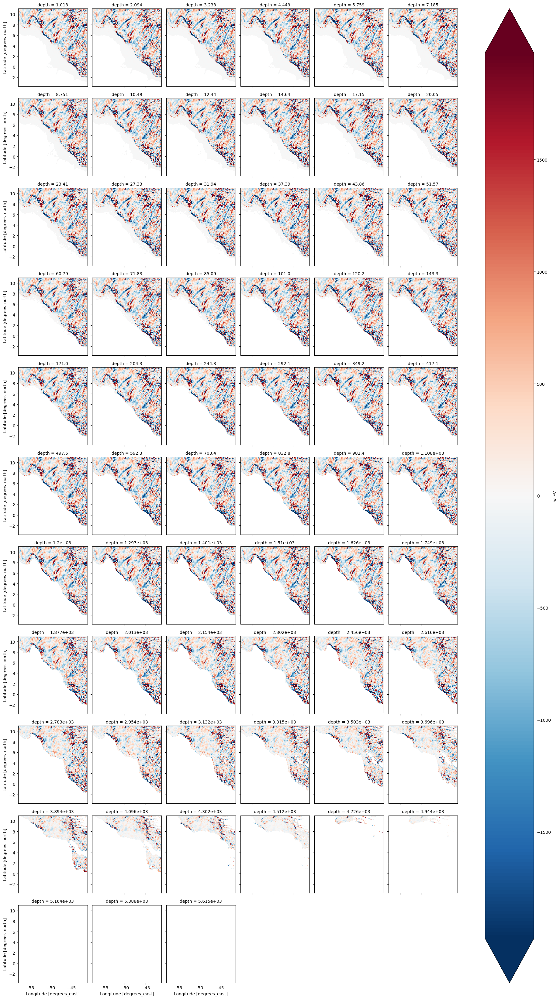

In [28]:
w_FV.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

In [29]:
# Step 7: Divide by horizontal area to get w in [m/s]
# area = dx_3d * dy_3d  # shape: (latitude, longitude)
area_3d = dx_3d * dy_3d
area_3d=area_3d.interp(depth=w_bottom_up.depth)

In [30]:
w_mps = w_bottom_up / area_3d  # now has units of [m/s]
w_mps.name = 'w_vertical'

In [33]:
print(area_3d.shape)
print(w_bottom_up.shape)
print(w_mps.shape)

(63, 177, 199)
(63, 177, 199)
(63, 177, 199)


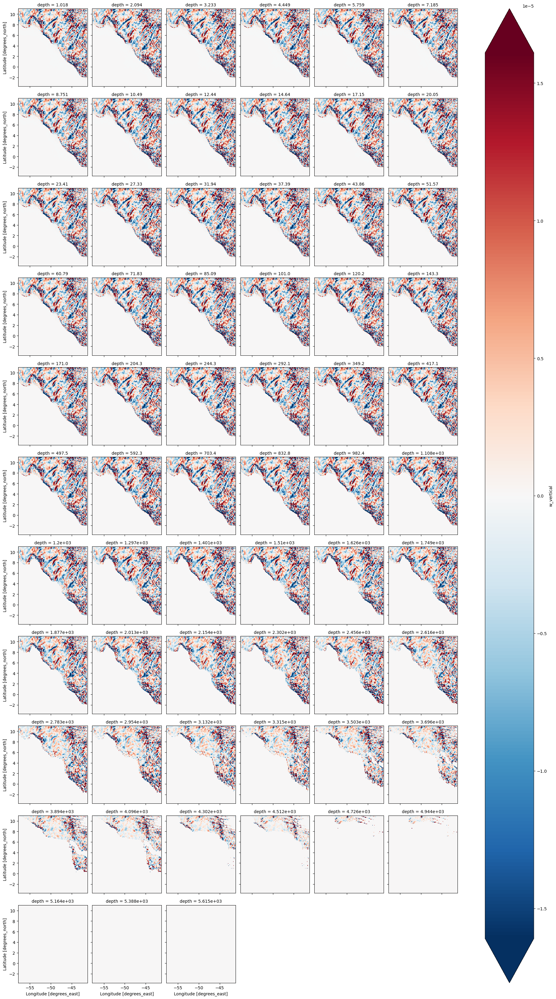

In [34]:
w_mps.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

Area Calculation

In [35]:
mask = (
    ((w_mps.latitude >= lat_min) & (w_mps.latitude <= lat_max)) &
    ((w_mps.longitude >= lon_min) & (w_mps.longitude <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
binary_mask = mask.astype(int)

# Broadcast to depth
mask_3f = xr.broadcast(w_mps.isel(depth=0)*0 + 1, binary_mask)[1]
mask_3f = mask_3f.where(mask_3f!=0,np.nan)

# wf = (w_mps * mask_3f)

In [36]:
uu = (ds_interp.uo * mask_3c).isel(time=0)
vv = (ds_interp.vo * mask_3c).isel(time=0)
wf = (w_mps * mask_3f)

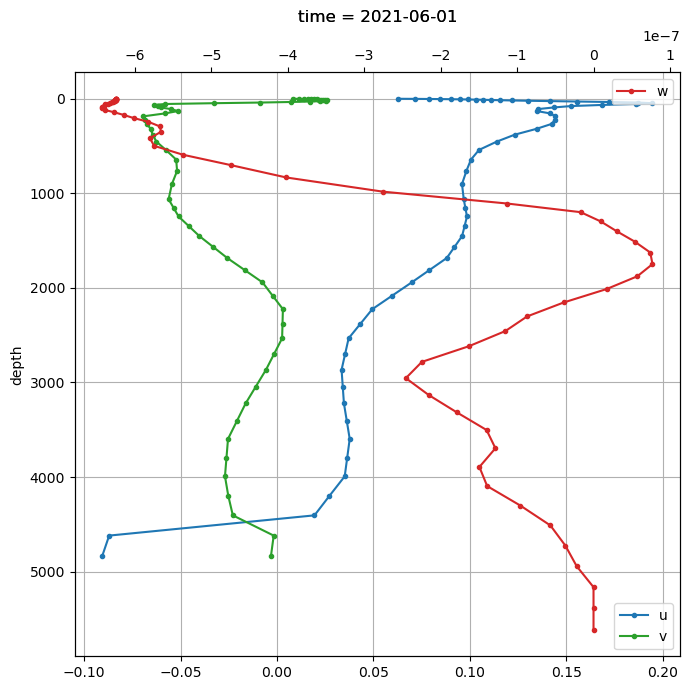

In [37]:
fig, ax = plt.subplots(figsize=(7, 7))

# Eje inferior: u y v
uu.mean(dim=('latitude', 'longitude'), skipna=True).plot(
    y='depth', marker='.', label='u', ax=ax, color='tab:blue')

vv.mean(dim=('latitude', 'longitude'), skipna=True).plot(
    y='depth', marker='.', label='v', ax=ax, color='tab:green')

# ax.set_ylim(0, 1500)
ax.invert_yaxis()
ax.grid(visible=True)
ax.legend(loc='lower right')

# Eje superior: w
ax2 = ax.twiny()
wf.mean(dim=('latitude', 'longitude'), skipna=True).plot(
    y='depth', marker='.', label='w', ax=ax2, color='tab:red')

ax2.legend(loc='upper right')

plt.tight_layout()
# plt.grid(True)
plt.show()

### Compare the finite difference and finite volume approaches

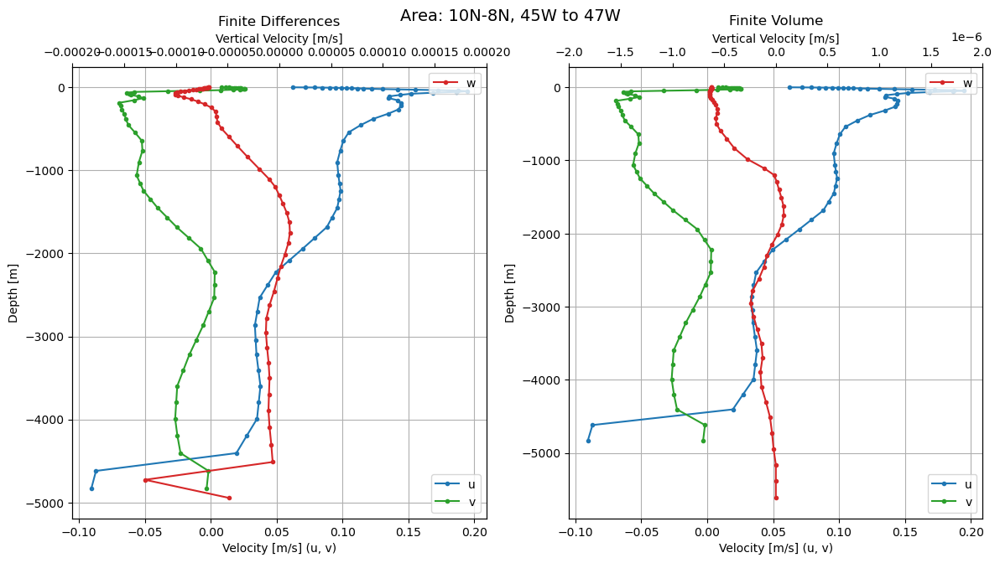

In [38]:
fig, ax = plt.subplots(1,2,figsize=(14,7))
fig.suptitle("Area: 10N-8N, 45W to 47W ", fontsize=14)

## finite diferences
ax[0].plot(uu.mean(dim=('latitude', 'longitude'), skipna=True),-u.depth,marker='.', label='u', color='tab:blue')
ax[0].plot(vv.mean(dim=('latitude', 'longitude'), skipna=True),-u.depth,marker='.', label='v', color='tab:green')
ax[0].set_ylabel("Depth [m]")
ax[0].set_xlabel("Velocity [m/s] (u, v)")
ax[0].grid(visible=True)
ax[0].legend(loc='lower right')
ax[0].set_title("Finite Differences")

# Plot w on top axis
ax2 = ax[0].twiny()
ax2.plot(ww.mean(dim=('latitude', 'longitude'), skipna=True),-ww.depth,marker='.', label='w', color='tab:red')
# ww.mean(dim=('latitude', 'longitude'), skipna=True).plot(
#     y='depth', marker='.', label='w', ax=ax2, color='tab:red')
ax2.set_xlabel("Vertical Velocity [m/s]")
ax2.set_xlim(-2e-4,2e-4)
ax2.legend(loc='upper right')

## finite volume
ax[1].plot(uu.mean(dim=('latitude', 'longitude'), skipna=True),-u.depth,marker='.', label='u', color='tab:blue')
ax[1].plot(vv.mean(dim=('latitude', 'longitude'), skipna=True),-u.depth,marker='.', label='v', color='tab:green')
ax[1].set_ylabel("Depth [m]")
ax[1].set_xlabel("Velocity [m/s] (u, v)")
ax[1].grid(visible=True)
ax[1].legend(loc='lower right')
ax[1].set_title("Finite Volume")

# Plot w on top axis
ax2 = ax[1].twiny()
ax2.plot(wf.mean(dim=('latitude', 'longitude'), skipna=True),-ww.depth,marker='.', label='w', color='tab:red')
# ww.mean(dim=('latitude', 'longitude'), skipna=True).plot(
#     y='depth', marker='.', label='w', ax=ax2, color='tab:red')
ax2.set_xlabel("Vertical Velocity [m/s]")
ax2.set_xlim(-2e-6,2e-6)
ax2.legend(loc='upper right')

# plt.savefig('Figures/W_fv.png',format='png', 
#             dpi=300, transparent=False,bbox_inches='tight')
plt.show()

* Finite Volume solution (right) works best, the quantities are realistic